# Botometer test

### Load data

In [1]:
import pandas as pd

# Just pandas display options
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

/var/folders/hx/0dxb0wn51wx5pscstjkwf2gc000qqf/T/ipykernel_5232/1648581370.py:7: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


In [3]:
# These variables are only used for loading the desired file here
keywords_en = 'mcdonalds russia' 
keywords_ru = 'макдональдс россия'
keywords_uk = 'макдональдс росія'
num_tweets = 5000
start_date = '2022-02-24'
end_date = '2022-03-17'

tweets_en_df = pd.read_csv('data/tweets_raw_en_df_' + keywords_en.replace(' ', '_') + str(num_tweets) + 'dailytweets_' + start_date + '_to_' + end_date + '.csv')
tweets_ru_df = pd.read_csv('data/tweets_raw_ru_df_' + keywords_ru.replace(' ', '_') + str(num_tweets) + 'dailytweets_' + start_date + '_to_' + end_date + '.csv')
tweets_uk_df = pd.read_csv('data/tweets_raw_uk_df_' + keywords_uk.replace(' ', '_') + str(num_tweets) + 'dailytweets_' + start_date + '_to_' + end_date + '.csv')

In [2]:
import json
import botometer

# Load my API keys
with open("../twitter_keys_config.json") as twitter_cfg_file:
    twitter_config = json.load(twitter_cfg_file)

with open("../rapidapi_keys_config.json") as rapidapi_cfg_file:
    rapidapi_config = json.load(rapidapi_cfg_file)

consumer_key = twitter_config["API_key"]
consumer_secret = twitter_config["API_secret"]
access_token = twitter_config["access_token"]
access_token_secret = twitter_config["access_secret"]

rapidapi_key = rapidapi_config["API_key"]


twitter_app_auth = {
                    'consumer_key': consumer_key,
                    'consumer_secret': consumer_secret,
                    'access_token': access_token,
                    'access_token_secret': access_token_secret
                   }
botometer_api_url = "https://botometer-pro.p.rapidapi.com"

bom = botometer.Botometer(
                wait_on_ratelimit = True,
                botometer_api_url=botometer_api_url,
                rapidapi_key = rapidapi_key,
                **twitter_app_auth)

In [9]:
# Botometer version 1.3: This does not work - they must have discontinued it :( 
from botometer import Botometer
import json

# Load my API keys
with open("../twitter_keys_config.json") as twitter_cfg_file:
    twitter_config = json.load(twitter_cfg_file)

with open("../rapidapi_keys_config.json") as rapidapi_cfg_file:
    rapidapi_config = json.load(rapidapi_cfg_file)

consumer_key = twitter_config["API_key"]
consumer_secret = twitter_config["API_secret"]
access_token = twitter_config["access_token"]
access_token_secret = twitter_config["access_secret"]

rapidapi_key = rapidapi_config["API_key"]


twitter_app_auth = {
                    'consumer_key': consumer_key,
                    'consumer_secret': consumer_secret,
                    'access_token': access_token,
                    'access_token_secret': access_token_secret
                   }
botometer_api_url = "https://botometer-pro.p.rapidapi.com"

botomete = Botometer(mashape_key=rapidapi_key, **twitter_app_auth, wait_on_ratelimit=True)

In [4]:
# Check a single account by screen name
result = bom.check_account('@BBCNews')
result

{'cap': {'english': 0.797053679565984, 'universal': 0.8074910771589409},
 'display_scores': {'english': {'astroturf': 0.8,
   'fake_follower': 1.1,
   'financial': 0.0,
   'other': 2.8,
   'overall': 2.8,
   'self_declared': 0.6,
   'spammer': 0.4},
  'universal': {'astroturf': 0.8,
   'fake_follower': 1.0,
   'financial': 0.1,
   'other': 3.6,
   'overall': 3.6,
   'self_declared': 0.7,
   'spammer': 0.4}},
 'raw_scores': {'english': {'astroturf': 0.17,
   'fake_follower': 0.22,
   'financial': 0.0,
   'other': 0.55,
   'overall': 0.55,
   'self_declared': 0.13,
   'spammer': 0.07},
  'universal': {'astroturf': 0.16,
   'fake_follower': 0.2,
   'financial': 0.02,
   'other': 0.72,
   'overall': 0.72,
   'self_declared': 0.14,
   'spammer': 0.08}},
 'user': {'majority_lang': 'en',
  'user_data': {'id_str': '612473', 'screen_name': 'BBCNews'}}}

In [6]:
result = bom.check_account('@JoeBiden')

In [13]:
result

{'cap': {'english': 0.797782173166965, 'universal': 0.8091273704655436},
 'display_scores': {'english': {'astroturf': 0.6,
   'fake_follower': 0.9,
   'financial': 0.0,
   'other': 3.5,
   'overall': 3.5,
   'self_declared': 2.6,
   'spammer': 0.2},
  'universal': {'astroturf': 0.5,
   'fake_follower': 0.7,
   'financial': 0.0,
   'other': 3.7,
   'overall': 3.7,
   'self_declared': 2.0,
   'spammer': 0.1}},
 'raw_scores': {'english': {'astroturf': 0.11,
   'fake_follower': 0.18,
   'financial': 0.01,
   'other': 0.7,
   'overall': 0.7,
   'self_declared': 0.51,
   'spammer': 0.05},
  'universal': {'astroturf': 0.1,
   'fake_follower': 0.14,
   'financial': 0.01,
   'other': 0.74,
   'overall': 0.74,
   'self_declared': 0.41,
   'spammer': 0.02}},
 'user': {'majority_lang': 'en',
  'user_data': {'id_str': '939091', 'screen_name': 'JoeBiden'}}}

In [30]:
result["cap"]["english"]

0.2787259978325127

In [24]:
accounts = tweets_en_df[80:100]["Username"].to_numpy()

for idx,account in enumerate(accounts):
    accounts[idx] = "@" + account

print(accounts)

['@CSI300_X' '@VJannerberg' '@mantequillaPtod' '@mark_woodroffe'
 '@LegaliseF' '@Nat10281' '@jfax14' '@xAthaz' '@no_username_yet'
 '@Hrdevonsal2' '@Mladen09016000' '@KatarzynaMari11' '@laudrupromario'
 '@mwolfgr' '@PiechowiakMicha' '@StrawberrPicker' '@Pawelwodnicki'
 '@KMetaKowalski' '@Vili__L' '@clauci2nd']


In [31]:
# Check a sequence of accounts
#accounts = ['@clayadavis', '@onurvarol', '@jabawack']
accounts_scores = []
for screen_name, result in bom.check_accounts_in(accounts):
    accounts_scores.append(result)

In [36]:
for account, account_score in zip(accounts, accounts_scores):
    print(account, account_score["cap"]["english"])

@CSI300_X 0.7852210697594887
@VJannerberg 0.7874002196908744
@mantequillaPtod 0.22631829961109876
@mark_woodroffe 0.7470839770895665
@LegaliseF 0.7611878625273879
@Nat10281 0.793087009461318
@jfax14 0.812935016236137
@xAthaz 0.5778862084370772
@no_username_yet 0.7759887465100499
@Hrdevonsal2 0.7920317685697057
@Mladen09016000 0.7826357858330618
@KatarzynaMari11 0.7053377817049258
@laudrupromario 0.36264564124632276
@mwolfgr 0.2520419704315795
@PiechowiakMicha 0.7668769621923945
@StrawberrPicker 0.2787259978325127
@Pawelwodnicki 0.7611878625273879
@KMetaKowalski 0.7611878625273879
@Vili__L 0.6763619064808265
@clauci2nd 0.7717813288270262


In [37]:
tweets_en_df.head(100)

,Unnamed: 0,Datetime,Tweet Id,Text,Username,Like Count,Display Name,Language,Num Followers,Num Friends
0,0,2022-02-24 23:50:15+00:00,1496995923376762929,"There are over 850 McDonalds locations in Russia, and Russia is getting sanctioned. How does McDonalds - an American company - legally opportune in a country under these sanctions? Sounds like they just lost @McDonaldsCorp https://t.co/A5WwPfh3Gc",honestduane,1,(((Duane))) - 🧙‍♂️🖖🦁,en,602.0,974.0
1,1,2022-02-24 23:10:35+00:00,1496985942456139777,#StandWithUkraine sanctions of Russia that do not cut off the sale of gas and oil are the same as ending the sale of salads at #McDonalds's. This is their economy and they can be put to their knee.,PZacsek,0,ambiguousBIG,en,16.0,68.0
2,2,2022-02-24 23:00:44+00:00,1496983462263328774,"@mrvintageestate For the first time, two countries with McDonalds in them have gone to war.\n\nI can't believe that's a legitimate sentence.\n\n#ukraine #russia #ukrainerussiaconflict https://t.co/IEl0cvkPUw",Wakato_owo,5,"Wakato, Mlarmch!!",en,128.0,667.0
3,3,2022-02-24 22:59:41+00:00,1496983198978519050,@Cisco @Apple @Microsoft @MDLZ @PepsiCo @McDonalds @Boeing @fordm @exxonmobil \nGet out of Russia. https://t.co/qyb1hROGWg,KaMac76,0,🌍KaterinaVonTramp😷🌊,en,1469.0,2792.0
4,4,2022-02-24 22:57:27+00:00,1496982636996317184,@lotus12282633 @DonnaJo1002 @fab4screamie @Valkyrry @PattiKimble @ShercoSherrill @network_gal @PRubesa @NoreneD39766667 @perrigoat @Swags_D17 @grupp_arthur @1stCAV_AM_1972 @AndrewTRei1 @JonMesser7 @elisabeth_pal @kim_f86 @Robyn_CherCrew @TheAwkwardLefty @dorismelmore1 @Jeeneree @GlennVotesBlue @mitch_gorman @JameJoh86430339 @TrishBeMe @AveryBa68752542 @unewmeb41 @WebbL03 @MoreWhit @dac37799066 @nadiepetah @rlongman1 @MVRaiderFan @debbie_american @Cherfan4ever1 @Meiguo_nan @gregdemarco1964 @TXhoneydew @RestlessNews @judeaa @markie_kmarky8 @kasseykrammer @SaulTgh @boris3324 @christraynor @Impeach66051636 @yazzyqz @Itridpm @DanerE_57 @jheil American companies need to get out of Russia — McDonalds &amp; Coke &amp; others,agavecorn,3,agave corn 💙#TheCountryIsSickFromLackOfJustice,en,12547.0,13208.0
5,5,2022-02-24 22:50:09+00:00,1496980798234402820,@FinnLove11 @adinqiang @pragmatictexan @CNN We asked Russia to Join Nato they said no. Yes America is bad we put our Nato Cannons on your territory and force all NATO countries to bow down and follow us. We vote for you too. We make you have Netflix McDonalds against your will. We are bad /s,Lutraboy1,0,Lutraboy,en,3.0,42.0
6,6,2022-02-24 22:49:09+00:00,1496980545338998784,Hey @McDonalds are you still in Russia?,BartoszBauza,1,Bartosz Bauza,en,289.0,147.0
7,7,2022-02-24 22:44:15+00:00,1496979312859181057,Russia invaded the Ukraine because McDonalds wont bring back the McRib,DownLoadedHats,3,Noah Wingfield,en,206.0,640.0
8,8,2022-02-24 22:37:05+00:00,1496977508339703809,@lisanandy @McDonalds @Starbucks &amp; @amazon Should pull out of Russia and Belarus. That would cause uproar amongst Russians and Belarusians. Think they would prefer to have these things rather than #MadVlad,t5vdubb,0,VDubstar,en,2.0,16.0
9,9,2022-02-24 22:33:54+00:00,1496976709626777600,@TraceyKent My Father was part of the McDonalds team that developed Russia. He cannot stand Vodka or Balalaika music to this day!,ChefWendyB,1,Nova Scotian Ontarian,en,546.0,802.0


### Make lowercase and remove punctuation

In [39]:
# Making lowercase
#tweets_en_df['Text_lower'] = tweets_en_df['Text'].apply(lambda x: " ".join(x.lower() for x in x.split()))
tweets_en_df['Text_lower'] = tweets_en_df['Text'].str.lower()

# Removing punctuation
tweets_en_df['Text_punc'] = tweets_en_df['Text'].str.replace('[^\w\s]','')

/var/folders/hx/0dxb0wn51wx5pscstjkwf2gc000qqf/T/ipykernel_63234/2292453947.py:6: FutureWarning: The default value of regex will change from True to False in a future version.
  tweets_en_df['Text_punc'] = tweets_en_df['Text'].str.replace('[^\w\s]','')


### Remove stopwords

In [40]:
# Removing stopwords
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
stop = stopwords.words('english')

tweets_en_df['Text_stop']  = tweets_en_df['Text_punc'] .apply(lambda x: " ".join(x for x in x.split() if x not in stop))

[nltk_data] Downloading package stopwords to /Users/ms731/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Tokenise tweets

In [41]:
# Tokenising tweets
import re
import textblob           
from textblob import TextBlob
def tokenization(text):
    text = re.split('\W+', text)
    return text
tweets_en_df['Text_tokenized'] = tweets_en_df['Text_stop'].apply(lambda x: tokenization(x.lower()))
tweets_en_df.head()

,Unnamed: 0,Datetime,Tweet Id,Text,Username,Like Count,Display Name,Language,Num Followers,Num Friends,Text_lower,Text_punc,Text_stop,Text_tokenized
0,0,2022-02-24 23:50:15+00:00,1496995923376762929,"There are over 850 McDonalds locations in Russia, and Russia is getting sanctioned. How does McDonalds - an American company - legally opportune in a country under these sanctions? Sounds like they just lost @McDonaldsCorp https://t.co/A5WwPfh3Gc",honestduane,1,(((Duane))) - 🧙‍♂️🖖🦁,en,602.0,974.0,"there are over 850 mcdonalds locations in russia, and russia is getting sanctioned. how does mcdonalds - an american company - legally opportune in a country under these sanctions? sounds like they just lost @mcdonaldscorp https://t.co/a5wwpfh3gc",There are over 850 McDonalds locations in Russia and Russia is getting sanctioned How does McDonalds an American company legally opportune in a country under these sanctions Sounds like they just lost McDonaldsCorp httpstcoA5WwPfh3Gc,There 850 McDonalds locations Russia Russia getting sanctioned How McDonalds American company legally opportune country sanctions Sounds like lost McDonaldsCorp httpstcoA5WwPfh3Gc,"[there, 850, mcdonalds, locations, russia, russia, getting, sanctioned, how, mcdonalds, american, company, legally, opportune, country, sanctions, sounds, like, lost, mcdonaldscorp, httpstcoa5wwpfh3gc]"
1,1,2022-02-24 23:10:35+00:00,1496985942456139777,#StandWithUkraine sanctions of Russia that do not cut off the sale of gas and oil are the same as ending the sale of salads at #McDonalds's. This is their economy and they can be put to their knee.,PZacsek,0,ambiguousBIG,en,16.0,68.0,#standwithukraine sanctions of russia that do not cut off the sale of gas and oil are the same as ending the sale of salads at #mcdonalds's. this is their economy and they can be put to their knee.,StandWithUkraine sanctions of Russia that do not cut off the sale of gas and oil are the same as ending the sale of salads at McDonaldss This is their economy and they can be put to their knee,StandWithUkraine sanctions Russia cut sale gas oil ending sale salads McDonaldss This economy put knee,"[standwithukraine, sanctions, russia, cut, sale, gas, oil, ending, sale, salads, mcdonaldss, this, economy, put, knee]"
2,2,2022-02-24 23:00:44+00:00,1496983462263328774,"@mrvintageestate For the first time, two countries with McDonalds in them have gone to war.\n\nI can't believe that's a legitimate sentence.\n\n#ukraine #russia #ukrainerussiaconflict https://t.co/IEl0cvkPUw",Wakato_owo,5,"Wakato, Mlarmch!!",en,128.0,667.0,"@mrvintageestate for the first time, two countries with mcdonalds in them have gone to war.\n\ni can't believe that's a legitimate sentence.\n\n#ukraine #russia #ukrainerussiaconflict https://t.co/iel0cvkpuw",mrvintageestate For the first time two countries with McDonalds in them have gone to war\n\nI cant believe thats a legitimate sentence\n\nukraine russia ukrainerussiaconflict httpstcoIEl0cvkPUw,mrvintageestate For first time two countries McDonalds gone war I cant believe thats legitimate sentence ukraine russia ukrainerussiaconflict httpstcoIEl0cvkPUw,"[mrvintageestate, for, first, time, two, countries, mcdonalds, gone, war, i, cant, believe, thats, legitimate, sentence, ukraine, russia, ukrainerussiaconflict, httpstcoiel0cvkpuw]"
3,3,2022-02-24 22:59:41+00:00,1496983198978519050,@Cisco @Apple @Microsoft @MDLZ @PepsiCo @McDonalds @Boeing @fordm @exxonmobil \nGet out of Russia. https://t.co/qyb1hROGWg,KaMac76,0,🌍KaterinaVonTramp😷🌊,en,1469.0,2792.0,@cisco @apple @microsoft @mdlz @pepsico @mcdonalds @boeing @fordm @exxonmobil \nget out of russia. https://t.co/qyb1hrogwg,Cisco Apple Microsoft MDLZ PepsiCo McDonalds Boeing fordm exxonmobil \nGet out of Russia httpstcoqyb1hROGWg,Cisco Apple Microsoft MDLZ PepsiCo McDonalds Boeing fordm exxonmobil Get Russia httpstcoqyb1hROGWg,"[cisco, apple, microsoft, mdlz, pepsico, mcdonalds, boeing, fordm, exxonmobil, get, russia, httpstcoqyb1hrogwg]"
4,4,2022-02-24 2

### Lemmatise tweets

In [42]:
# Lemmatising the tweets
#nltk.download('wordnet') This must be run once to download the wordnet
wn = nltk.WordNetLemmatizer()
def lemmatizer(text):
    text = [wn.lemmatize(word) for word in text]
    return text

tweets_en_df['Text_lemmatized'] = tweets_en_df['Text_tokenized'].apply(lambda x: lemmatizer(x))
tweets_en_df[['Text', 'Text_punc', 'Text_tokenized','Text_stop','Text_lemmatized']][0:90]

,Text,Text_punc,Text_tokenized,Text_stop,Text_lemmatized
0,"There are over 850 McDonalds locations in Russia, and Russia is getting sanctioned. How does McDonalds - an American company - legally opportune in a country under these sanctions? Sounds like they just lost @McDonaldsCorp https://t.co/A5WwPfh3Gc",There are over 850 McDonalds locations in Russia and Russia is getting sanctioned How does McDonalds an American company legally opportune in a country under these sanctions Sounds like they just lost McDonaldsCorp httpstcoA5WwPfh3Gc,"[there, 850, mcdonalds, locations, russia, russia, getting, sanctioned, how, mcdonalds, american, company, legally, opportune, country, sanctions, sounds, like, lost, mcdonaldscorp, httpstcoa5wwpfh3gc]",There 850 McDonalds locations Russia Russia getting sanctioned How McDonalds American company legally opportune country sanctions Sounds like lost McDonaldsCorp httpstcoA5WwPfh3Gc,"[there, 850, mcdonalds, location, russia, russia, getting, sanctioned, how, mcdonalds, american, company, legally, opportune, country, sanction, sound, like, lost, mcdonaldscorp, httpstcoa5wwpfh3gc]"
1,#StandWithUkraine sanctions of Russia that do not cut off the sale of gas and oil are the same as ending the sale of salads at #McDonalds's. This is their economy and they can be put to their knee.,StandWithUkraine sanctions of Russia that do not cut off the sale of gas and oil are the same as ending the sale of salads at McDonaldss This is their economy and they can be put to their knee,"[standwithukraine, sanctions, russia, cut, sale, gas, oil, ending, sale, salads, mcdonaldss, this, economy, put, knee]",StandWithUkraine sanctions Russia cut sale gas oil ending sale salads McDonaldss This economy put knee,"[standwithukraine, sanction, russia, cut, sale, gas, oil, ending, sale, salad, mcdonaldss, this, economy, put, knee]"
2,"@mrvintageestate For the first time, two countries with McDonalds in them have gone to war.\n\nI can't believe that's a legitimate sentence.\n\n#ukraine #russia #ukrainerussiaconflict https://t.co/IEl0cvkPUw",mrvintageestate For the first time two countries with McDonalds in them have gone to war\n\nI cant believe thats a legitimate sentence\n\nukraine russia ukrainerussiaconflict httpstcoIEl0cvkPUw,"[mrvintageestate, for, first, time, two, countries, mcdonalds, gone, war, i, cant, believe, thats, legitimate, sentence, ukraine, russia, ukrainerussiaconflict, httpstcoiel0cvkpuw]",mrvintageestate For first time two countries McDonalds gone war I cant believe thats legitimate sentence ukraine russia ukrainerussiaconflict httpstcoIEl0cvkPUw,"[mrvintageestate, for, first, time, two, country, mcdonalds, gone, war, i, cant, believe, thats, legitimate, sentence, ukraine, russia, ukrainerussiaconflict, httpstcoiel0cvkpuw]"
3,@Cisco @Apple @Microsoft @MDLZ @PepsiCo @McDonalds @Boeing @fordm @exxonmobil \nGet out of Russia. https://t.co/qyb1hROGWg,Cisco Apple Microsoft MDLZ PepsiCo McDonalds Boeing fordm exxonmobil \nGet out of Russia httpstcoqyb1hROGWg,"[cisco, apple, microsoft, mdlz, pepsico, mcdonalds, boeing, fordm, exxonmobil, get, russia, httpstcoqyb1hrogwg]",Cisco Apple Microsoft MDLZ PepsiCo McDonalds Boeing fordm exxonmobil Get Russia httpstcoqyb1hROGWg,"[cisco, apple, microsoft, mdlz, pepsico, mcdonalds, boeing, fordm, exxonmobil, get, russia, httpstcoqyb1hrogwg]"
4,@lotus12282633 @DonnaJo1002 @fab4screamie @Valkyrry @PattiKimble @ShercoSherrill @network_gal @PRubesa @NoreneD39766667 @perrigoat @Swags_D17 @grupp_arthur @1stCAV_AM_1972 @AndrewTRei1 @JonMesser7 @elisabeth_pal @kim_f86 @Robyn_CherCrew @TheAwkwardLefty @dorismelmore1 @Jeeneree @GlennVotesBlue @mitch_gorman @JameJoh86430339 @TrishBeMe @AveryBa68752542 @unewmeb41 @WebbL03 @MoreWhit @dac37799066 @nadiepetah @rlongman1 @MVRaiderFan @debbie_american @Cherfan4ever1 @Meiguo_nan @gregdemarco1964 @TXhoneydew @RestlessNews @judeaa @markie_kmarky8 @kasseykrammer @SaulTgh @boris3324 @christraynor @Impeach66051636 @yazzyqz @Itridpm @DanerE_57 @jhei

### Get rid of the unnecessary columns and save dataframes

In [44]:
tweets_en_df = tweets_en_df.drop(columns=['Text_lower', 'Text_punc', 'Text_tokenized', 'Text_stop', 'Language'])

In [45]:
tweets_en_df.to_csv('data/tweets_clean_en_df_' + keywords_en.replace(' ', '_') + str(num_tweets) + 'dailytweets_' + start_date + '_to_' + end_date + '.csv')

### Let's create a wordcloud to gauge what we can see

In [49]:
from PIL import Image
from wordcloud import WordCloud,ImageColorGenerator,STOPWORDS
import matplotlib.pyplot as plt

In [47]:
tweets_en_df.Text_lemmatized

0        [there, 850, mcdonalds, location, russia, russia, getting, sanctioned, how, mcdonalds, american, company, legally, opportune, country, sanction, sound, like, lost, mcdonaldscorp, httpstcoa5wwpfh3gc]                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         
1        [standwithukraine, sanction, russia, cut, sale, gas, oil, ending, sale, salad, mcdonaldss, this, economy, put, knee]                                                  

There are 2281573 words in the combination of all review.


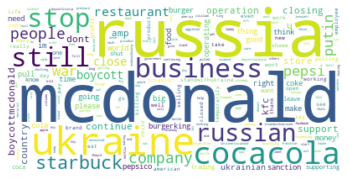

In [76]:
# We converted each tweet text string into a list of strings during tokenisation. 
# Therefore we must convert, for each tweet, the list of strings into a single string.
# But we actually make a list of strings for all tweets first, and then convert that
# into a single string
text_list = [" ".join(tweet) for tweet in tweets_en_df.Text_lemmatized]
text = " ".join(text_list)
print ("There are {} words in the combination of all review.".format(len(text)))

# Create stopword list:
stopwords = set(STOPWORDS)

# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white", collocations=False).generate(text)

# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Save dataframes